# <font color='blue'>INDICIUM - LIGHTHOUSE</font>

# <font color='blue'>Projeto de Análise de Filmes, Faturamentos e Avaliações</font>

#### <font color='blue'>Análise Exploratória de Dados e Machine Learning em Linguagem Python - Heverton Alves Mendonça</font>

## Imports Iniciais

In [1]:
# Mostrar Versão da Linguagem Python
from platform import python_version
print('Versão da Linguagem Python Usada Neste Jupyter Notebook:', python_version())

Versão da Linguagem Python Usada Neste Jupyter Notebook: 3.11.5


In [ ]:
# Instalar pacote ydata-profiling para gerar relatórios durante a análise exploratória
pip install -U ydata-profiling
# Instalar pacote xgboost para criação do modelo de machine learning
!pip install xgboost

In [2]:
# Imports para análise exploratória
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from ydata_profiling import ProfileReport

In [3]:
# Imports das bibliotecas necessárias para o modelo de machine learning
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.impute import SimpleImputer
import pickle

## Carregando e Mostrando os Dados

In [4]:
# Carregar o dataset
file_path = r"C:\Users\nome3\Documents\desafio_incidium_ciencia_de_dados\imdb\desafio_indicium_imdb.csv"
df = pd.read_csv(file_path)

In [5]:
# Mostrar o número de linhas e colunas
df.shape

(999, 16)

In [6]:
# Amostra das primeiras linhas do dataset
df.head()

,Unnamed: 0,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,1,The Godfather,1972,A,175 min,"Crime, Drama",9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367,"134,966,411"
1,2,The Dark Knight,2008,UA,152 min,"Action, Crime, Drama",9.0,When the menace known as the Joker wreaks havo...,84.0,Christopher Nolan,Christian Bale,Heath Ledger,Aaron Eckhart,Michael Caine,2303232,"534,858,444"
2,3,The Godfather: Part II,1974,A,202 min,"Crime, Drama",9.0,The early life and career of Vito Corleone in ...,90.0,Francis Ford Coppola,Al Pacino,Robert De Niro,Robert Duvall,Diane Keaton,1129952,"57,300,000"
3,4,12 Angry Men,1957,U,96 min,"Crime, Drama",9.0,A jury holdout attempts to prevent a miscarria...,96.0,Sidney Lumet,Henry Fonda,Lee J. Cobb,Martin Balsam,John Fiedler,689845,"4,360,000"
4,5,The Lord of the Rings: The Return of the King,2003,U,201 min,"Action, Adventure, Drama",8.9,Gandalf and Aragorn lead the World of Men agai...,94.0,Peter Jackson,Elijah Wood,Viggo Mortensen,Ian McKellen,Orlando Bloom,1642758,"377,845,905"


In [7]:
# Amostra das últimas linhas do dataset
df.tail()

,Unnamed: 0,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
994,995,Breakfast at Tiffany's,1961,A,115 min,"Comedy, Drama, Romance",7.6,A young New York socialite becomes interested ...,76.0,Blake Edwards,Audrey Hepburn,George Peppard,Patricia Neal,Buddy Ebsen,166544,NaN
995,996,Giant,1956,G,201 min,"Drama, Western",7.6,Sprawling epic covering the life of a Texas ca...,84.0,George Stevens,Elizabeth Taylor,Rock Hudson,James Dean,Carroll Baker,34075,NaN
996,997,From Here to Eternity,1953,Passed,118 min,"Drama, Romance, War",7.6,"In Hawaii in 1941, a private is cruelly punish...",85.0,Fred Zinnemann,Burt Lancaster,Montgomery Clift,Deborah Kerr,Donna Reed,43374,"30,500,000"
997,998,Lifeboat,1944,NaN,97 min,"Drama, War",7.6,Several survivors of a torpedoed merchant ship...,78.0,Alfred Hitchcock,Tallulah Bankhead,John Hodiak,Walter Slezak,William Bendix,26471,NaN
998,999,The 39 Steps,1935,NaN,86 min,"Crime, Mystery, Thriller",7.6,A man in London tries to help a counter-espion...,93.0,Alfred Hitchcock,Robert Donat,Madeleine Carroll,Lucie Mannheim,Godfrey Tearle,51853,NaN


In [8]:
# Mostrar informações sobre todas as colunas do dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     999 non-null    int64  
 1   Series_Title   999 non-null    object 
 2   Released_Year  999 non-null    object 
 3   Certificate    898 non-null    object 
 4   Runtime        999 non-null    object 
 5   Genre          999 non-null    object 
 6   IMDB_Rating    999 non-null    float64
 7   Overview       999 non-null    object 
 8   Meta_score     842 non-null    float64
 9   Director       999 non-null    object 
 10  Star1          999 non-null    object 
 11  Star2          999 non-null    object 
 12  Star3          999 non-null    object 
 13  Star4          999 non-null    object 
 14  No_of_Votes    999 non-null    int64  
 15  Gross          830 non-null    object 
dtypes: float64(2), int64(2), object(12)
memory usage: 125.0+ KB


### A amostragem dos dados deixa claro que há a necessidade de diversas alterações por conta de valores nulos, tipos de colunas, valores numéricos que estão em tipo texto, colunas desnecessárias etc.


## Análise Exploratória

In [9]:
# Exclusão da coluna Unnamed: 0
df = df.drop(columns='Unnamed: 0')

In [10]:
# Contagem de valores numéricos das colunas de ano, número de votos e faturamento

colunas_para_converter_float = ['Released_Year', 'No_of_Votes', 'Gross']
valores_numericos_por_coluna = {}
for coluna in colunas_para_converter_float:
    # Converte para numérico, valores não numéricos viram NaN
    valores_numericos = pd.to_numeric(df[coluna], errors='coerce')
    # Conta os valores não NaN
    contagem = valores_numericos.notna().sum()
    valores_numericos_por_coluna[coluna] = contagem
valores_numericos_por_coluna

{'Released_Year': 998, 'No_of_Votes': 999, 'Gross': 0}

### Há um valor não numérico na coluna Released_Year e todos os valores da coluna Gross não estão em formato numérico.

In [11]:
# Transformar os valores não numéricos da coluna Released_Year em valores nulos e transformá-la em tipo float 
df['Released_Year'] = pd.to_numeric(df['Released_Year'], errors='coerce').astype(float)

In [12]:
# Remover as vírgulas duplicadas dos valores da coluna Gross e transformá-la em tipo float
df['Gross'] = df['Gross'].str.replace(',', '').astype(float)

In [13]:
# Transformar a coluna No_of_Votes em tipo float
df['No_of_Votes'] = df['No_of_Votes'].astype(float)

In [14]:
# Análise de valores nulos no dataset
df.isna().sum()

Series_Title       0
Released_Year      1
Certificate      101
Runtime            0
Genre              0
IMDB_Rating        0
Overview           0
Meta_score       157
Director           0
Star1              0
Star2              0
Star3              0
Star4              0
No_of_Votes        0
Gross            169
dtype: int64

### A coluna Runtime deve ser alterada para ser transformada em tipo numérico

In [15]:
# Retirar os caracteres após o número de minutos dos filmes e transformar a coluna em tipo float
df['Runtime'] = df['Runtime'].str.extract('(\d+)', expand=False).astype(float)

In [16]:
# Verificar as alterações realizadas
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Series_Title   999 non-null    object 
 1   Released_Year  998 non-null    float64
 2   Certificate    898 non-null    object 
 3   Runtime        999 non-null    float64
 4   Genre          999 non-null    object 
 5   IMDB_Rating    999 non-null    float64
 6   Overview       999 non-null    object 
 7   Meta_score     842 non-null    float64
 8   Director       999 non-null    object 
 9   Star1          999 non-null    object 
 10  Star2          999 non-null    object 
 11  Star3          999 non-null    object 
 12  Star4          999 non-null    object 
 13  No_of_Votes    999 non-null    float64
 14  Gross          830 non-null    float64
dtypes: float64(6), object(9)
memory usage: 117.2+ KB


### Aqui é tomada a decisão de transformação das colunas de tipo object para category pra possibilitar mais análises

In [17]:
# Transformar em tipo categórico as colunas a seguir
Colunas_fatores = ['Genre','Certificate','Director','Star1','Star2','Star3','Star4']
df[Colunas_fatores] = df[Colunas_fatores].astype('category')

In [18]:
# Verificar as alterações realizadas
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Series_Title   999 non-null    object  
 1   Released_Year  998 non-null    float64 
 2   Certificate    898 non-null    category
 3   Runtime        999 non-null    float64 
 4   Genre          999 non-null    category
 5   IMDB_Rating    999 non-null    float64 
 6   Overview       999 non-null    object  
 7   Meta_score     842 non-null    float64 
 8   Director       999 non-null    category
 9   Star1          999 non-null    category
 10  Star2          999 non-null    category
 11  Star3          999 non-null    category
 12  Star4          999 non-null    category
 13  No_of_Votes    999 non-null    float64 
 14  Gross          830 non-null    float64 
dtypes: category(7), float64(6), object(2)
memory usage: 245.1+ KB


In [19]:
# Mostrar cinco linhas do dataset alterado 
df.sample(5)

,Series_Title,Released_Year,Certificate,Runtime,Genre,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
320,Das Cabinet des Dr. Caligari,1920.0,NaN,76.0,"Fantasy, Horror, Mystery",8.1,"Hypnotist Dr. Caligari uses a somnambulist, Ce...",NaN,Robert Wiene,Werner Krauss,Conrad Veidt,Friedrich Feher,Lil Dagover,57428.0,NaN
600,Kokuhaku,2010.0,NaN,106.0,"Drama, Thriller",7.8,A psychological thriller of a grieving mother ...,NaN,Tetsuya Nakashima,Takako Matsu,Yoshino Kimura,Masaki Okada,Yukito Nishii,35713.0,NaN
683,The Killing Fields,1984.0,UA,141.0,"Biography, Drama, History",7.8,A journalist is trapped in Cambodia during tyr...,76.0,Roland Joffé,Sam Waterston,Haing S. Ngor,John Malkovich,Julian Sands,51585.0,34700291.0
693,La planète sauvage,1973.0,U,72.0,"Animation, Sci-Fi",7.8,"On a faraway planet where blue giants rule, op...",73.0,René Laloux,Barry Bostwick,Jennifer Drake,Eric Baugin,Jean Topart,25229.0,193817.0
237,Munna Bhai M.B.B.S.,2003.0,U,156.0,"Comedy, Drama, Musical",8.1,A gangster sets out to fulfill his father's dr...,NaN,Rajkumar Hirani,Sanjay Dutt,Arshad Warsi,Gracy Singh,Sunil Dutt,73992.0,NaN


In [20]:
# Gerar relatório para análise exploratória do dataframe com o pacote ydata_profiling.
profile1 = ProfileReport(df)
profile1

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Com base no relatório as seguintes ações tiveram que ser tomadas:

- Dividir a coluna gênero em outras colunas, visto que da forma que está possui alta cardinalidade e que provavelmente é uma coluna importante para a alimentação do modelo de machine learning;
- Optar por retirar as linhas onde hajam valores nulos das colunas Gross e Meta_Score ao invés de preencher os valores nulos com técnicas de imputação de média, mediana, etc;
- Substituir os valores nulos na coluna Certificate por "ausente" para que não sejam perdidas mais linhas do dataset e também porque esta coluna é importante para a alimentação do modelo;
- Remover as linhas com valores duplicados na coluna Series_Title;
- Não utilizar as colunas das estrelas, diretores, nome do filme e descrição para o treinamento do modelo, visto que possuem altíssima cardinalidade e tornaria o modelo menos preciso, além de que necessitaria de alta capacidade computacional e tempo para o treinamento.

In [21]:
# Dividir a coluna 'Gênero' em listas de gêneros
generos_divididos = df['Genre'].str.split(',', expand=True)

# Renomear as colunas resultantes
generos_divididos.columns = ['Gênero1', 'Gênero2', 'Gênero3']

# Preencher as células vazias com "ausente"
generos_divididos = generos_divididos.fillna('ausente')

# Remover espaços em branco extras
generos_divididos = generos_divididos.applymap(lambda x: x.strip() if isinstance(x, str) else x)

#Transformar as colunas para o tipo category
generos_divididos.astype('category')

# Mostrar dataframe
generos_divididos.sample(3)

,Gênero1,Gênero2,Gênero3
886,Action,Adventure,Comedy
158,Biography,Drama,ausente
32,Crime,Drama,Thriller


In [22]:
# Substituir a coluna Genre pelas novas no dataframe original e mostrar cinco linhas do dataframe
df = df.drop('Genre', axis=1)

for i, col in enumerate(generos_divididos.columns):
    df.insert(4 + i, col, generos_divididos[col])
    
df.sample(3)

,Series_Title,Released_Year,Certificate,Runtime,Gênero1,Gênero2,Gênero3,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
522,Carlito's Way,1993.0,A,144.0,Crime,Drama,Thriller,7.9,"A Puerto Rican former convict, just released f...",65.0,Brian De Palma,Al Pacino,Sean Penn,Penelope Ann Miller,John Leguizamo,201000.0,36948322.0
474,Jojo Rabbit,2019.0,UA,108.0,Comedy,Drama,War,7.9,A young boy in Hitler's army finds out his mot...,58.0,Taika Waititi,Roman Griffin Davis,Thomasin McKenzie,Scarlett Johansson,Taika Waititi,297918.0,349555.0
266,Stand by Me,1986.0,U,89.0,Adventure,Drama,ausente,8.1,"After the death of one of his friends, a write...",75.0,Rob Reiner,Wil Wheaton,River Phoenix,Corey Feldman,Jerry O'Connell,363401.0,52287414.0


In [23]:
# Remover as linhas com valores nulos nas colunas "Gross" e "Meta_score"
df = df.dropna(subset=['Gross', 'Meta_score', 'Released_Year'])

# Substituir os valores nulos na coluna "Certificate" por "ausente":
df['Certificate'] = df['Certificate'].cat.add_categories(['ausente'])
df['Certificate'] = df['Certificate'].fillna('ausente')

#Remover as linhas com valores duplicados na coluna Series_Title:
df = df.drop_duplicates(subset='Series_Title', keep='first')

In [24]:
# Transformar as novas colunas de gênero no tipo categórico
Colunas_fatores = ['Gênero1','Gênero2','Gênero3']
df[Colunas_fatores] = df[Colunas_fatores].astype('category')

In [25]:
# Verificar as alterações realizadas
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 748 entries, 0 to 996
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Series_Title   748 non-null    object  
 1   Released_Year  748 non-null    float64 
 2   Certificate    748 non-null    category
 3   Runtime        748 non-null    float64 
 4   Gênero1        748 non-null    category
 5   Gênero2        748 non-null    category
 6   Gênero3        748 non-null    category
 7   IMDB_Rating    748 non-null    float64 
 8   Overview       748 non-null    object  
 9   Meta_score     748 non-null    float64 
 10  Director       748 non-null    category
 11  Star1          748 non-null    category
 12  Star2          748 non-null    category
 13  Star3          748 non-null    category
 14  Star4          748 non-null    category
 15  No_of_Votes    748 non-null    float64 
 16  Gross          748 non-null    float64 
dtypes: category(9), float64(6), object(2)
me

In [26]:
# Realizar novo relatório para análise exploratória do dataframe modificado
profile2 = ProfileReport(df)
profile2

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Com o novo relatório já é possível responder algumas perguntas do problema de negócio. As respostas estarão listadas ao final deste documento.

### Análise dos outliers

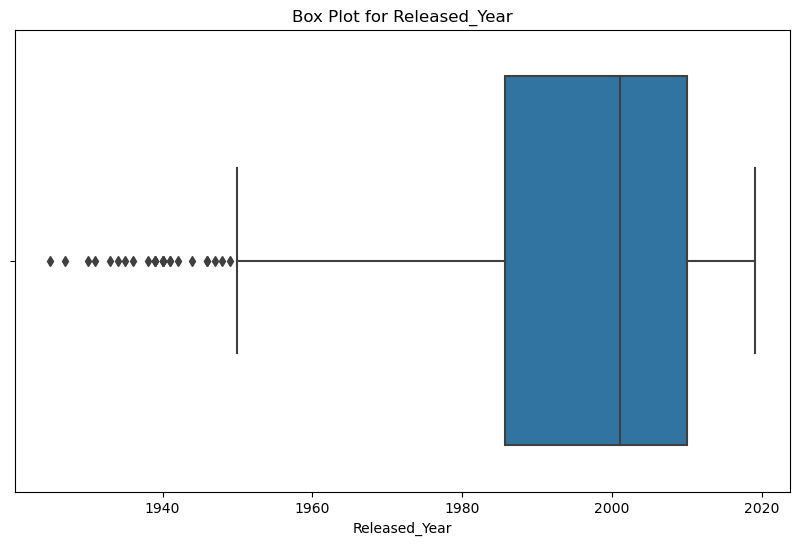

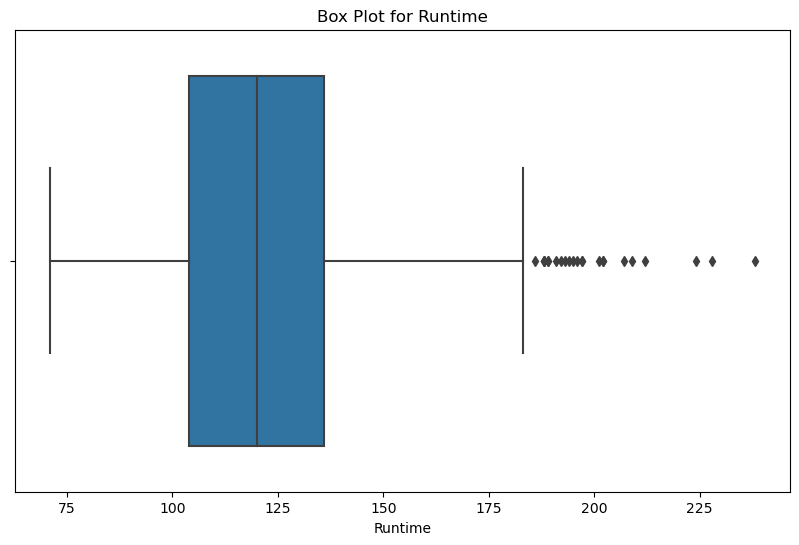

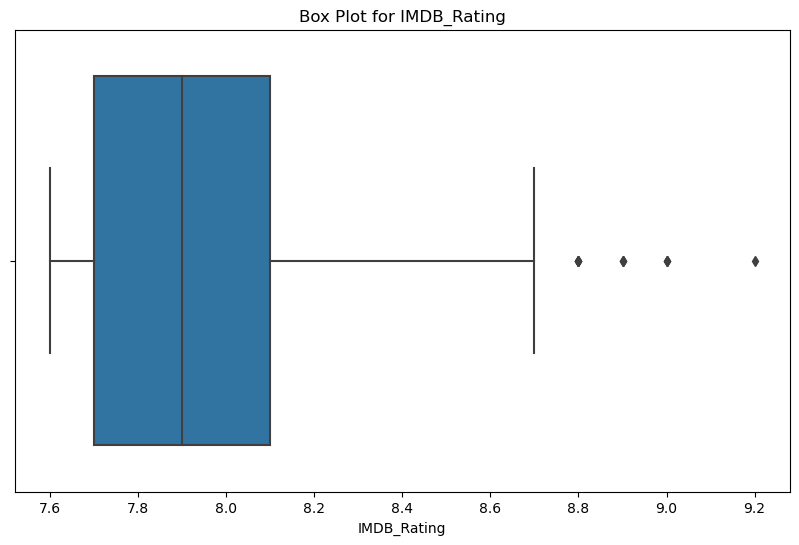

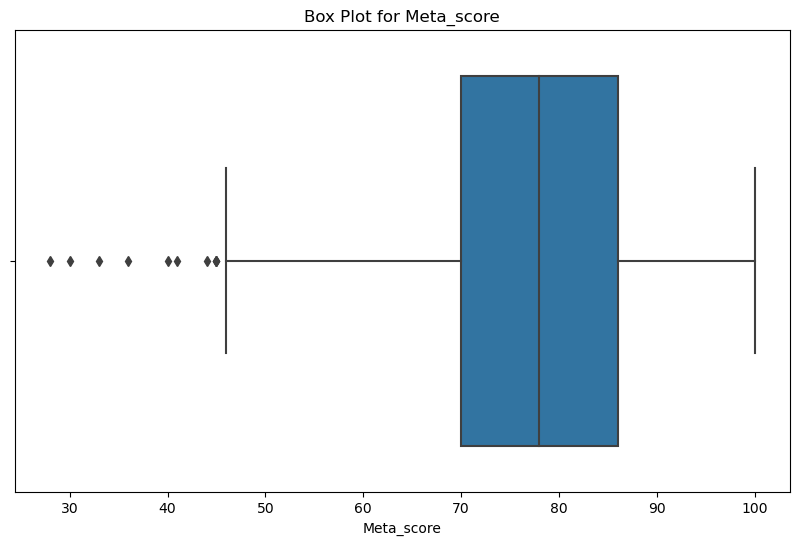

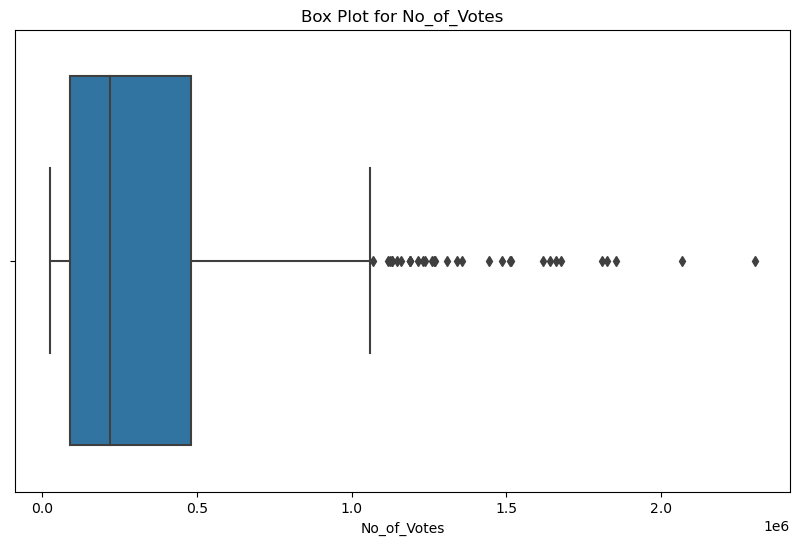

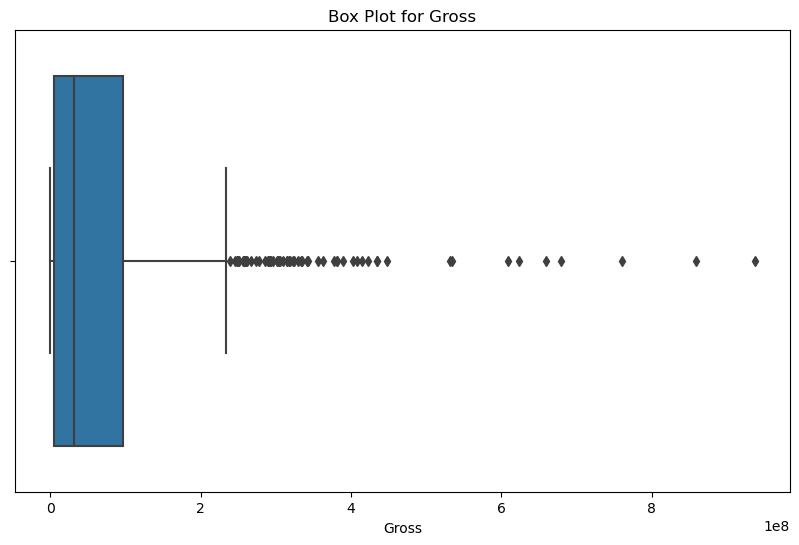

In [27]:
# Selecionar colunas do tipo float:
float_columns = df.select_dtypes(include=['float64']).columns

# Ativar inline plotting
%matplotlib inline

# Plotar os outliers
for col in float_columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Box Plot for {col}')
    plt.xlabel(col)
    plt.show()

### Aqui tomei a decisão de não remover ou tratar os outliers do dataframe.

# Treinamento do Modelo de Machine Learning

In [28]:
#Remover colunas que não serão utilizadas para o Modelo e mostrar cinco linhas do dataframe de treino
columns_to_drop = ['Series_Title', 'Overview', 'Director', 'Star1', 'Star2', 'Star3', 'Star4']
dftreino = df.drop(columns=columns_to_drop)
dftreino.sample(5)

,Released_Year,Certificate,Runtime,Gênero1,Gênero2,Gênero3,IMDB_Rating,Meta_score,No_of_Votes,Gross
505,2004.0,U,142.0,Adventure,Family,Fantasy,7.9,82.0,552493.0,249358727.0
667,1991.0,R,98.0,Drama,Fantasy,Music,7.8,86.0,42376.0,1999955.0
332,2017.0,U,113.0,Drama,Family,ausente,8.0,66.0,141923.0,132422809.0
13,1999.0,A,136.0,Action,Sci-Fi,ausente,8.7,73.0,1676426.0,171479930.0
5,1994.0,A,154.0,Crime,Drama,ausente,8.9,94.0,1826188.0,107928762.0


In [29]:
# Selecionar features e alvo
X = dftreino[['Released_Year', 'Certificate', 'Gênero1', 'Gênero2', 'Gênero3',
       'Runtime', 'Meta_score', 'No_of_Votes', 'Gross']]
y = dftreino['IMDB_Rating']

# Converter variáveis categóricas em variáveis indicadoras para preparação dos dados 
X = pd.get_dummies(X, columns=['Certificate', 'Gênero1', 'Gênero2', 'Gênero3'])

In [30]:
# Dividir os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [31]:
#Definir o Modelo XGBoost para resolver um problema de Regressão:
model = xgb.XGBRegressor()

In [32]:
#Definir a Grade de Hiperparâmetros para Busca:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0]
}

In [33]:
# Configurar a Busca Aleatória (RandomizedSearchCV):
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_grid,
    n_iter=50,  # Número de combinações de hiperparâmetros para testar
    scoring='neg_mean_squared_error',  # Métrica de avaliação
    cv=5,  # Validação cruzada com 5 folds
    verbose=1,
    random_state=42,
    n_jobs=-1  # Utiliza todos os núcleos de CPU disponíveis
)

In [34]:
#Executar a Busca Aleatória:
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          multi_strategy=None,
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None,
                                          random_state=None, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.7, 0.8, 0.9,
                                                             1.0],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.7, 0.8, 0.9, 1.0]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=1)

In [35]:
# Avaliar o melhor modelo
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f"Melhores hiperparâmetros: {random_search.best_params_}")
print(f"Mean Squared Error do melhor modelo: {mse}")
print(f'R^2 Score: {r2}')

Melhores hiperparâmetros: {'subsample': 1.0, 'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.05, 'colsample_bytree': 1.0}
Mean Squared Error do melhor modelo: 0.03549193472171047
R^2 Score: 0.5590187525258381


### Aqui tomei a atitude de realizar um segundo teste sem as colunas categóricas:

In [36]:
# Selecionar features e alvo
X2 = df[['Released_Year', 'Runtime', 'Meta_score', 'No_of_Votes', 'Gross']]
y2 = df['IMDB_Rating']

In [37]:
# Dividir os dados em treino e teste
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

In [38]:
#Definir o Modelo XGBoost para Regressão:
model2 = xgb.XGBRegressor()

In [39]:
#Executar a Busca Aleatória:
random_search.fit(X2_train, y2_train)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          gamma=None, grow_policy=None,
                                          importance_type=None,
                                          interaction_constraints=None,
                                          learning_rate=...
                                          multi_strategy=None,
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None,
                                          random_state=None, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.7, 0.8, 0.9,
                                                             1.0],
                                        'learning_rate': [0.01, 0.05, 0.1, 0.2],
                                        'max_depth': [3, 4, 5, 6],
                                        'n_estimators': [100, 200, 300],
                                        'subsample': [0.7, 0.8, 0.9, 1.0]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=1)

In [40]:
# Avaliar o melhor modelo
best_model2 = random_search.best_estimator_
y2_pred = best_model2.predict(X2_test)
mse = mean_squared_error(y2_test, y2_pred)
r2 = r2_score(y2_test, y2_pred)
print(f"Melhores hiperparâmetros: {random_search.best_params_}")
print(f"Mean Squared Error do melhor modelo: {mse}")
print(f'R^2 Score: {r2}')

Melhores hiperparâmetros: {'subsample': 0.7, 'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.05, 'colsample_bytree': 1.0}
Mean Squared Error do melhor modelo: 0.03703851217296513
R^2 Score: 0.5398027909526726


### Com base nas métricas fornecidas o primeiro modelo parece ser superior ao segundo em termos de desempenho geral. Ele possui um MSE menor, indicando maior precisão média das previsões, e um R² score mais alto, indicando melhor capacidade de explicar a variabilidade dos dados em relação ao Modelo 2.

# Previsão da nota IMBD do filme proposto pelo problema de negócio

In [41]:
# Normalização manual nos novos dados
# Foram retiradas as colunas de nome do filme, resumo, diretores e estrelas, e dividida a coluna gênero em três
# Caso houvesse a necessidade de fazer diversas previsões seria necessário a criação de uma função para a conversão
filme = {
    'Released_Year': [1994],
    'Certificate': ['A'],
    'Gênero1': ['Drama'],
    'Gênero2': ['ausente'],
    'Gênero3': ['ausente'],
    'Runtime': [142],
    'Meta_score': [80.0],
    'No_of_Votes': [2343110],
    'Gross': [28341469]
}

# Transformar os dados do filme em um dataframe
new_df = pd.DataFrame(filme)

# Mostrar dataframe
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Released_Year  1 non-null      int64  
 1   Certificate    1 non-null      object 
 2   Gênero1        1 non-null      object 
 3   Gênero2        1 non-null      object 
 4   Gênero3        1 non-null      object 
 5   Runtime        1 non-null      int64  
 6   Meta_score     1 non-null      float64
 7   No_of_Votes    1 non-null      int64  
 8   Gross          1 non-null      int64  
dtypes: float64(1), int64(4), object(4)
memory usage: 204.0+ bytes


In [42]:
# Definir as colunas que serão transformadas em categóricas
categorical_columns = ['Certificate', 'Gênero1', 'Gênero2', 'Gênero3']

# Transformar colunas em categóricas
new_df[categorical_columns] = new_df[categorical_columns].astype('category')

In [43]:
# Converter variáveis categóricas em variáveis indicadoras
new_df = pd.get_dummies(new_df, columns=categorical_columns)

In [44]:
# Certificar que new_df tenha todas as colunas de X_train
new_df = new_df.reindex(columns=X_train.columns, fill_value=0)

In [45]:
# Fazer previsões com os novos dados
new_predictions = best_model.predict(new_df)

print("Previsões para os novos dados:")
print(new_predictions)

Previsões para os novos dados:
[8.763064]


# Perguntas do Problema de Negócio

### Qual filme você recomendaria para uma pessoa que você não conhece?

O filme que eu recomendaria para uma pessoa que eu não conheço seria o com maior nota do IMDB_Rating e Meta_Score, que seria o The Godfather, de 1972.

In [47]:
# Mostrar o filme com a mlehor nota do IMDB_Rating
df_sorted = df.sort_values(by='IMDB_Rating', ascending=False).head(1)
display(df_sorted)

,Series_Title,Released_Year,Certificate,Runtime,Gênero1,Gênero2,Gênero3,IMDB_Rating,Overview,Meta_score,Director,Star1,Star2,Star3,Star4,No_of_Votes,Gross
0,The Godfather,1972.0,A,175.0,Crime,Drama,ausente,9.2,An organized crime dynasty's aging patriarch t...,100.0,Francis Ford Coppola,Marlon Brando,Al Pacino,James Caan,Diane Keaton,1620367.0,134966411.0


### Quais são os principais fatores que estão relacionados com alta expectativa de faturamento de um filme?

Os principais fatores que estão relacionados com alta expectativa de faturamento de um filme, como consta na matriz de correlação apresentada no segundo relatório estatístico durante a análise exploratória, é primeiramente a correlação forte do número de votos do filme, e em seguida a correlação fraca do Tempo de filme, o ano de lançamento e o gênero.

### Quais insights podem ser tirados com a coluna Overview? É possível inferir o gênero do filme a partir dessa coluna?

A coluna Overview, assim como a coluna dos nomes dos filmes, é uniformemente distribuída e portanto não há como estabelecer relações fortes entre ela e outras variáveis e nem utilizá-la de forma eficaz para o aprendizado do modelo de machine learning no que se refere ao problema de negócio em questão. Para se retirar insights relevantes desta coluna seria necessário separar algumas palavras chaves específicas por tipo de gênero, utilizar técnicas de processamento de texto para extrair essas palavras-chave das descrições dos filmes, converter as descrições dos filmes em representações numéricas e treinar um modelo de classificação, como Naive Bayes, SVM (Support Vector Machines) ou redes neurais, para prever o gênero com base nas representações numéricas das descrições. Ou seja, existe a possibilidade de se inferir o gênero do filme a partir da coluna Overview, porém, talvez a quantidade de dados apresentada no dataset inicial seja pequena para tal tarefa.

### Explique como você faria a previsão da nota do imdb a partir dos dados. Quais variáveis e/ou suas transformações você utilizou e por quê?

A previsão da nota do IMDB do filme proposto no exercício foi prevista conforme os insights retirados durante a análise exploratória. 
Para isso foram retiradas de análise as colunas do nome do filme e descrição, além de ter sido necessário realizar diversas alterações e correções no dataframe inicial para que fosse possível criar um modelo eficiente de machine learning. Todo o passo a passo demonstrado neste documento possui as explicações do porquê as decisões foram tomadas.

### Qual tipo de problema estamos resolvendo (regressão, classificação)?

O tipo de problema que estamos resolvendo é de regressão, visto que a maioria das variáveis são contínuas e apenas as colunas de gênero e certificado foram utilizadas como do tipo categoria.

### Qual modelo melhor se aproxima dos dados e quais seus prós e contras?

O modelo que utilizei foi o xgboost pois ele geralmente oferece melhor desempenho preditivo em comparação com outros algoritmos de machine learning devido à sua capacidade de lidar com relações complexas entre variáveis e sua robustez contra overfitting, além de poder lidar com variáveis numéricas e categóricas diretamente.
Por outro lado, O desempenho do XGBoost pode depender bastante da escolha adequada de hiperparâmetros, o que pode exigir ajuste fino e validação cruzada, além de poder exigir mais dados de treinamento para alcançar desempenho ideal se comparado a modelos mais simples.

### Qual medida de performance do modelo foi escolhida e por quê?

A medida de performance utilizada foi a do erro quadrático médio (Mean Squared Error, MSE). Ela é frequentemente utilizada em problemas de regressão para medir a média dos quadrados dos erros entre os valores preditos e os valores reais. A escolha foi feita com base no tipo de problema (regressão), nas características dos dados (como desbalanceamento de classes e presença de outliers) e no objetivo que determinei para minimizar erros absolutos e maximizar a explicação da variabilidade.

### Supondo um filme com as características apresentadas do filme "The Shawshank Redemption", Qual seria a sua nota do IMDB? :

A nota do IMDB prevista do filme "The Shawshank Redemption" foi de aproximadamente 8.8 de acordo com o modelo de machine learning apresentado.

# Exportar versões de pacotes utilizados e do modelo de machine learning

In [54]:
# O arquivo requirements.txt foi criado a partir do prompt de comando do anaconda com o comando:
# conda list --export > requirements.txt

In [50]:
# baixar o modelo em formato .pkl
with open('best_model.pkl', 'wb') as file:
    pickle.dump(best_model, file)

# Fim